## Machine Learning Model Explanation with SHAP

In [0]:
# !pip install catboost
# !pip install shap
# !pip install feature_engine

In [0]:

import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline

%matplotlib inline

In [2]:
import catboost
print('catboost version:', catboost.__version__)

from catboost import CatBoostClassifier 

catboost version: 0.23.2


### Data

The data is from the credit loans from lending club. It has already been prepocessed.

In [0]:
# Data 
df = pd.read_csv("/content/drive/My Drive/Lendingclub_data_preparation/train.csv")

In [4]:
df.head()

,funded_amnt_inv,int_rate,annual_inc,dti,delinq_2yrs,pub_rec,revol_bal,revol_util,total_acc,tot_coll_amt,acc_open_past_24mths,avg_cur_bal,mo_sin_rcnt_tl,mort_acc,mths_since_recent_inq,num_accts_ever_120_pd,num_sats,pub_rec_bankruptcies,year_from_earliest_cr_line,fico_score,inq_last_6mths,term,grade,emp_length,home_ownership,verification_status,purpose,initial_list_status,loan_status
0,10000.0,14.31,70000.0,18.16,0,no,20874,42.6,24,no,12,32098,4,4,15.0,0,19,no,10.168587,702.0,0,36 months,C,< 1 year,MORTGAGE,Verified,other,f,1
1,2000.0,16.55,60000.0,30.24,0,no,26548,93.8,19,no,3,8525,7,0,0.0,0,9,no,13.580019,682.0,more_than_1,36 months,D,10+ years,MORTGAGE,Not Verified,other,w,0
2,33600.0,19.19,80000.0,10.71,more_than_1,yes,16330,63.3,23,no,6,12111,6,4,6.0,0,15,no,14.417818,677.0,1,36 months,E,9 years,MORTGAGE,Source Verified,debt_consolidation,w,1
3,9775.0,11.99,47000.0,8.31,0,no,10188,54.5,8,yes,1,2547,17,0,17.0,0,4,no,11.833234,682.0,0,36 months,C,2 years,RENT,Not Verified,debt_consolidation,w,0
4,11700.0,13.99,65000.0,29.27,0,no,78533,59.0,25,no,3,10668,2,2,2.0,0,9,no,19.499374,672.0,more_than_1,36 months,C,10+ years,RENT,Source Verified,debt_consolidation,w,0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 268614 entries, 0 to 268613
Data columns (total 29 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   funded_amnt_inv             268614 non-null  float64
 1   int_rate                    268614 non-null  float64
 2   annual_inc                  268614 non-null  float64
 3   dti                         268612 non-null  float64
 4   delinq_2yrs                 268614 non-null  object 
 5   pub_rec                     268614 non-null  object 
 6   revol_bal                   268614 non-null  int64  
 7   revol_util                  268511 non-null  float64
 8   total_acc                   268614 non-null  int64  
 9   tot_coll_amt                268614 non-null  object 
 10  acc_open_past_24mths        268614 non-null  int64  
 11  avg_cur_bal                 268614 non-null  int64  
 12  mo_sin_rcnt_tl              268614 non-null  int64  
 13  mort_acc      

Only few important features will be selected for modeling. The features were selected based on permutation importance approach.

In [0]:
with open ('/content/drive/My Drive/Lendingclub_data_preparation/permuted_features.txt','r') as f:
  features_to_select = f.read().split(",")

In [7]:
features_to_select

['int_rate',
 'term',
 'acc_open_past_24mths',
 'dti',
 'funded_amnt_inv',
 'avg_cur_bal',
 'emp_length',
 'fico_score',
 'home_ownership',
 'grade',
 'mort_acc',
 'revol_util',
 'revol_bal',
 'annual_inc',
 'mths_since_recent_inq',
 'year_from_earliest_cr_line',
 'delinq_2yrs']

In [0]:
# selecting the features and the target feature loan_status
features_to_select.append('loan_status')
df = df[features_to_select]

In [9]:
df.head()

,int_rate,term,acc_open_past_24mths,dti,funded_amnt_inv,avg_cur_bal,emp_length,fico_score,home_ownership,grade,mort_acc,revol_util,revol_bal,annual_inc,mths_since_recent_inq,year_from_earliest_cr_line,delinq_2yrs,loan_status
0,14.31,36 months,12,18.16,10000.0,32098,< 1 year,702.0,MORTGAGE,C,4,42.6,20874,70000.0,15.0,10.168587,0,1
1,16.55,36 months,3,30.24,2000.0,8525,10+ years,682.0,MORTGAGE,D,0,93.8,26548,60000.0,0.0,13.580019,0,0
2,19.19,36 months,6,10.71,33600.0,12111,9 years,677.0,MORTGAGE,E,4,63.3,16330,80000.0,6.0,14.417818,more_than_1,1
3,11.99,36 months,1,8.31,9775.0,2547,2 years,682.0,RENT,C,0,54.5,10188,47000.0,17.0,11.833234,0,0
4,13.99,36 months,3,29.27,11700.0,10668,10+ years,672.0,RENT,C,2,59.0,78533,65000.0,2.0,19.499374,0,0


loan_status is the target features that indicates if the loan was defaulted or not.

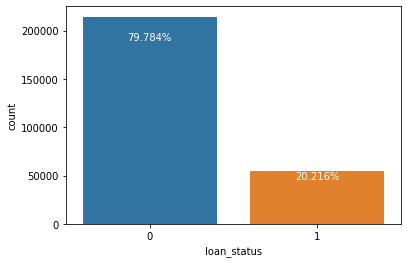

In [15]:
# Distribution of Loan Status
total = len(df.loan_status)
ax = sns.countplot(df.loan_status )
for axes in ax.patches:
  x = axes.get_x()+ axes.get_width()/2
  y = axes.get_height() *0.90
  ax.text(x,y, str(round((axes.get_height()/total) *100,3))+'%', horizontalalignment='center',verticalalignment='center', color = 'white')

In [0]:
# !pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [0]:
from pandas_profiling import ProfileReport

In [0]:
profile = ProfileReport(df)

In [19]:
profile

### Data preparation pipeline

Preparing the pipeline for final data processing.

In [0]:
import feature_engine
from feature_engine import missing_data_imputers as mi
from feature_engine import discretisers as dsc
from feature_engine import categorical_encoders as ce 
from feature_engine import variable_transformers as vt

In [0]:
# creating pipeline
pipeline =  Pipeline(
    steps = [
           # missing data indicator
           ('missing_ind', mi.AddMissingIndicator(variables=['mths_since_recent_inq', 'emp_length'])),

           # missing value imputation for numerical features
           ('missing_impute_num', mi.MeanMedianImputer(imputation_method='median',
                                                       variables = ['mths_since_recent_inq','dti','revol_util'])),
            
           # missing value imputation for categorical features
            ('missing_imput_cat', mi.CategoricalVariableImputer(variables='emp_length')),

            # one hot encoding of categorical variables
            ('mean_encoding', ce.OneHotCategoricalEncoder())
    ])

In [0]:
# transform the data with the pipeline
df_transform = pipeline.fit_transform(df)

In [25]:
df_transform.head()

,int_rate,acc_open_past_24mths,dti,funded_amnt_inv,avg_cur_bal,fico_score,mort_acc,revol_util,revol_bal,annual_inc,mths_since_recent_inq,year_from_earliest_cr_line,loan_status,mths_since_recent_inq_na,emp_length_na,term_ 36 months,term_ 60 months,emp_length_< 1 year,emp_length_10+ years,emp_length_9 years,emp_length_2 years,emp_length_Missing,emp_length_8 years,emp_length_4 years,emp_length_6 years,emp_length_5 years,emp_length_1 year,emp_length_3 years,emp_length_7 years,home_ownership_MORTGAGE,home_ownership_RENT,home_ownership_OWN,grade_C,grade_D,grade_E,grade_B,grade_A,grade_F,grade_G,delinq_2yrs_0,delinq_2yrs_more_than_1,delinq_2yrs_1
0,14.31,12,18.16,10000.0,32098,702.0,4,42.6,20874,70000.0,15.0,10.168587,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0
1,16.55,3,30.24,2000.0,8525,682.0,0,93.8,26548,60000.0,0.0,13.580019,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0
2,19.19,6,10.71,33600.0,12111,677.0,4,63.3,16330,80000.0,6.0,14.417818,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0
3,11.99,1,8.31,9775.0,2547,682.0,0,54.5,10188,47000.0,17.0,11.833234,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0
4,13.99,3,29.27,11700.0,10668,672.0,2,59.0,78533,65000.0,2.0,19.499374,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0


In [0]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(df_transform.drop('loan_status', axis = 1), df_transform['loan_status'], test_size = 0.3, random_state = 12)

In [36]:
X_train.head()

,int_rate,acc_open_past_24mths,dti,funded_amnt_inv,avg_cur_bal,fico_score,mort_acc,revol_util,revol_bal,annual_inc,mths_since_recent_inq,year_from_earliest_cr_line,mths_since_recent_inq_na,emp_length_na,term_ 36 months,term_ 60 months,emp_length_< 1 year,emp_length_10+ years,emp_length_9 years,emp_length_2 years,emp_length_Missing,emp_length_8 years,emp_length_4 years,emp_length_6 years,emp_length_5 years,emp_length_1 year,emp_length_3 years,emp_length_7 years,home_ownership_MORTGAGE,home_ownership_RENT,home_ownership_OWN,grade_C,grade_D,grade_E,grade_B,grade_A,grade_F,grade_G,delinq_2yrs_0,delinq_2yrs_more_than_1,delinq_2yrs_1
137453,9.17,4,33.35,8700.0,17024,682.0,5,54.7,73118,110000.0,17.0,21.662320,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0
114815,13.33,10,23.67,9975.0,10605,682.0,1,93.6,18621,65000.0,5.0,8.076826,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0
260861,6.89,6,1.72,10000.0,1305,792.0,0,12.6,3915,55000.0,7.0,18.746449,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0
117928,10.64,5,14.95,12000.0,2516,672.0,0,58.9,6480,50000.0,7.0,3.165021,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0
163148,18.84,3,17.17,15075.0,1999,662.0,0,70.8,17993,42000.0,5.0,9.916699,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0


## Modeling with catboost

In [38]:
params = {'iterations':5000,
        'learning_rate':0.01,
         'depth':3,
        'eval_metric':'AUC',
        'verbose':200,
        'od_type':"Iter", # overfit detector
        'od_wait':500, # most recent best iteration to wait before stopping
        'random_seed': 1
          }

cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train,   
          eval_set=(X_test, y_test), 
          use_best_model=True, # True if we don't want to save trees created after iteration with the best validation score
          plot=True  
         );

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.7038208	best: 0.7038208 (0)	total: 65.9ms	remaining: 5m 29s
200:	test: 0.7305567	best: 0.7305567 (200)	total: 13.7s	remaining: 5m 27s
400:	test: 0.7342665	best: 0.7342665 (400)	total: 27.2s	remaining: 5m 11s
600:	test: 0.7359016	best: 0.7359016 (600)	total: 40.9s	remaining: 4m 59s
800:	test: 0.7367811	best: 0.7367811 (800)	total: 54.9s	remaining: 4m 47s
1000:	test: 0.7373501	best: 0.7373501 (1000)	total: 1m 8s	remaining: 4m 35s
1200:	test: 0.7377930	best: 0.7377930 (1200)	total: 1m 23s	remaining: 4m 23s
1400:	test: 0.7381840	best: 0.7381840 (1400)	total: 1m 38s	remaining: 4m 11s
1600:	test: 0.7385243	best: 0.7385246 (1599)	total: 1m 53s	remaining: 4m
1800:	test: 0.7387562	best: 0.7387562 (1800)	total: 2m 8s	remaining: 3m 48s
2000:	test: 0.7389624	best: 0.7389624 (2000)	total: 2m 24s	remaining: 3m 35s
2200:	test: 0.7391420	best: 0.7391426 (2199)	total: 2m 39s	remaining: 3m 23s
2400:	test: 0.7393179	best: 0.7393179 (2400)	total: 2m 56s	remaining: 3m 10s
2600:	test: 0.7394832	b

## Model explanation with SHAP

In [0]:
# SHapley Additive exPlanations
import shap
from catboost import Pool

shap_values = cat_model.get_feature_importance(Pool(X_test, label=y_test) , type="ShapValues")


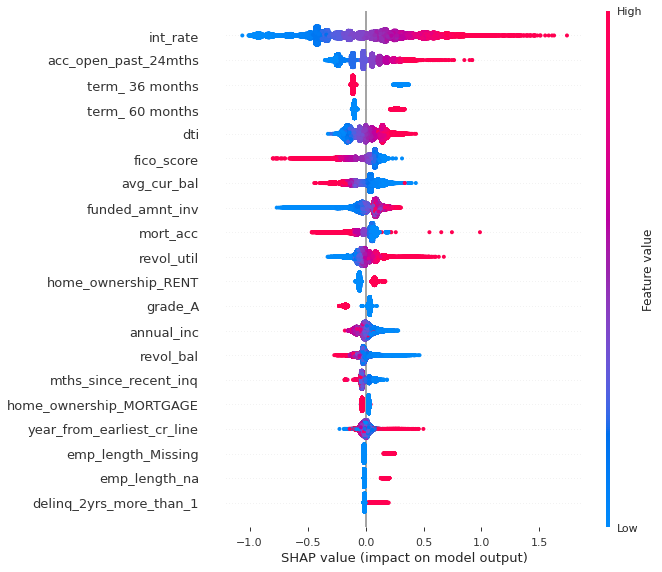

In [47]:
shap.summary_plot(shap_values[:,:-1], X_test)

### Explaning the feature effect for a single cases

In [0]:
expected_value = shap_values[0,-1]
shap_values = shap_values[:,:-1]

In [57]:
# feature effect for a good loan
shap.initjs()


good_loan = X_test.iloc[0,:]
shap.force_plot(expected_value, shap_values[0,:], good_loan)

In [59]:
# feature effect for a good loan
shap.initjs()


bad_loan = X_test.iloc[4,:]
shap.force_plot(expected_value, shap_values[4,:], bad_loan)

In [51]:
X_test

,int_rate,acc_open_past_24mths,dti,funded_amnt_inv,avg_cur_bal,fico_score,mort_acc,revol_util,revol_bal,annual_inc,mths_since_recent_inq,year_from_earliest_cr_line,mths_since_recent_inq_na,emp_length_na,term_ 36 months,term_ 60 months,emp_length_< 1 year,emp_length_10+ years,emp_length_9 years,emp_length_2 years,emp_length_Missing,emp_length_8 years,emp_length_4 years,emp_length_6 years,emp_length_5 years,emp_length_1 year,emp_length_3 years,emp_length_7 years,home_ownership_MORTGAGE,home_ownership_RENT,home_ownership_OWN,grade_C,grade_D,grade_E,grade_B,grade_A,grade_F,grade_G,delinq_2yrs_0,delinq_2yrs_more_than_1,delinq_2yrs_1
73112,12.69,3,19.50,20000.0,8286,667.0,2,98.9,44120,136000.0,1.0,31.923996,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0
177329,8.19,6,14.46,8125.0,4693,687.0,0,26.7,15969,60000.0,2.0,17.914126,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0
92425,6.99,4,28.20,9500.0,13347,687.0,2,74.2,9272,40000.0,7.0,11.334935,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0
209409,13.33,7,12.56,12000.0,19701,667.0,3,63.7,10517,54000.0,9.0,17.251552,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0
43612,21.99,4,31.73,26725.0,11003,737.0,0,98.3,10713,61000.0,9.0,13.495144,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37818,5.32,2,23.62,24000.0,3901,692.0,0,71.8,24781,66000.0,5.0,24.586405,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0
197466,8.38,5,23.91,35000.0,22844,707.0,3,61.5,27469,95000.0,2.0,14.165931,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0
197011,19.99,10,24.06,17600.0,3185,702.0,1,60.5,19226,40000.0,6.0,15.666304,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0
124398,9.49,21,15.22,8400.0,189,782.0,3,10.9,4901,25000.0,2.0,26.502940,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0
